In [9]:
import numpy as np 
import random
import pandas as pd 
import matplotlib.pyplot as plt 
import torch 
import torch.nn as nn 
import torch.nn.functional as F 
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms 
print(torch.__version__)
print("CUDA available: ", torch.cuda.is_available())


2.1.1
CUDA available:  False


In [ ]:
## set parameters

In [1]:
# Root directory for dataset
dataroot = r'C:/Users/15403/Desktop/fall semester 2023/computer vision and machine learning/Project_2/pok/Pokemon Dataset'

# Number of workers for dataloader
# From 2 to 0 due to run time error in RGP show
workers = 0

# Batch size during training
batch_size = 20

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 500

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
import os
from PIL import Image

def get_dataset_info(dataroot):
    # Initialize counters and variables
    num_images = 0
    image_sizes = set()

    # Iterate through the directory to count images and collect sizes
    for root, dirs, files in os.walk(dataroot):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg', '.gif')):
                num_images += 1
                file_path = os.path.join(root, file)
                with Image.open(file_path) as img:
                    width, height = img.size
                    image_sizes.add((width, height))

    # Calculate statistics
    unique_sizes = len(image_sizes)
    total_image_sizes = len(image_sizes)
    min_width, min_height = min(image_sizes) if image_sizes else (0, 0)
    max_width, max_height = max(image_sizes) if image_sizes else (0, 0)

    # Print dataset information
    print("Dataset Information:")
    print(f"Root directory: {dataroot}")
    print(f"Number of images: {num_images}")
    print(f"Number of unique image sizes: {unique_sizes}")
    print(f"Total unique image sizes: {total_image_sizes}")
    print(f"Minimum image size: {min_width}x{min_height}")
    print(f"Maximum image size: {max_width}x{max_height}")

# Replace 'dataroot' with the directory containing your images
get_dataset_info(r'C:/Users/15403/Desktop/fall semester 2023/computer vision and machine learning/Project_2/pok/Pokemon Dataset')



Dataset Information:
Root directory: C:/Users/15403/Desktop/fall semester 2023/computer vision and machine learning/Project_2/pok/Pokemon Dataset
Number of images: 898
Number of unique image sizes: 1
Total unique image sizes: 1
Minimum image size: 475x475
Maximum image size: 475x475


In [14]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os
from torchvision.transforms import Lambda


class CustomDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.images[idx])
        image = Image.open(img_name)
        if self.transform:
            image = self.transform(image)
        return image

# Path to your single folder with images
dataroot = dataroot
# Define transformations
from torchvision.transforms import Lambda

# Define transformations
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.Lambda(lambda img: img.convert('RGB') if img.mode != 'RGB' else img),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


# Create the dataset
dataset = CustomDataset(image_dir=dataroot, transform=transform)

# Create the dataloader
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

torch.Size([20, 3, 64, 64])


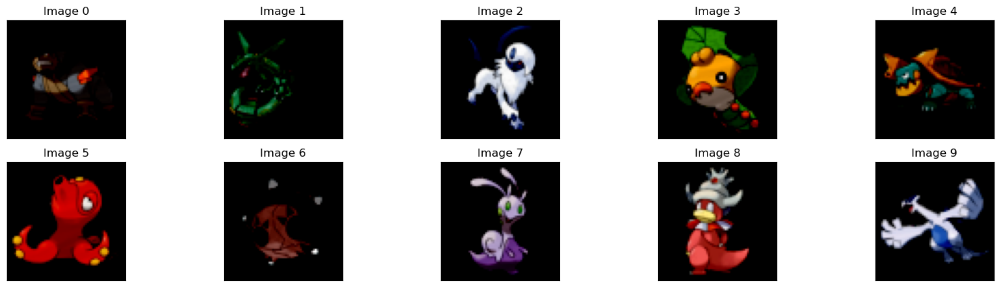

In [15]:

def show_images(images, plot_only):
    """
    Display a grid of images using matplotlib.

    Args:
    - images (Tensor): Batch of images to display.
    - plot_only (int): Number of images to plot.

    Returns:
    - None
    """
    def display_image(img):
        img = img.numpy()
        plt.imshow(np.transpose(img, (1, 2, 0)))

    rows = 2
    cols = (plot_only + 1) // 2  # Ensure enough columns for all images
    fig = plt.figure(figsize=(20, 5))

    for idx in range(plot_only):
        ax = fig.add_subplot(rows, cols, idx + 1, xticks=[], yticks=[])
        display_image(images[idx])
        ax.set_title(f"Image {idx}")

    plt.show()  # Display the grid of images


In [13]:

def custom_weights_init(m):
    """
    Custom weights initialization for neural network modules.

    Args:
    - m (torch.nn.Module): Neural network module.

    Returns:
    - None
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [18]:
import torch
import torch.nn as nn
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [19]:
# Number of GPUs to use (0 for CPU mode)
ngpu = 0

# Create the generator
netG = Generator(ngpu)

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [20]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [21]:
ngpu = 0

# Create the Discriminator
netD = Discriminator(ngpu)

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)



Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [22]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(224, nz, 1, 1)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [23]:
import torchvision.utils as vutils

def train(num_epochs, dataloader, netG, netD, optimizerG, optimizerD, criterion, ngpu, nz, device, fixed_noise, real_label, fake_label):
    # Lists to keep track of progress
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0

    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):
            netD.zero_grad()
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            output = netD(real_cpu).view(-1)
            errD_real = criterion(output, label)
            errD_real.backward()
            D_x = output.mean().item()

            noise = torch.randn(b_size, nz, 1, 1, device=device)
            fake = netG(noise)
            label.fill_(fake_label)
            output = netD(fake.detach()).view(-1)
            errD_fake = criterion(output, label)
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            errD = errD_real + errD_fake
            optimizerD.step()

            
            netG.zero_grad()
            label.fill_(real_label)
            output = netD(fake).view(-1)
            errG = criterion(output, label)
            errG.backward()
            D_G_z2 = output.mean().item()
            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                      % (epoch, num_epochs, i, len(dataloader),
                         errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1

    return img_list, G_losses, D_losses


Starting Training Loop...
[0/500][0/45]	Loss_D: 3.2200	Loss_G: 17.4896	D(x): 0.2133	D(G(z)): 0.8127 / 0.0000
[1/500][0/45]	Loss_D: 0.0774	Loss_G: 14.8888	D(x): 0.9256	D(G(z)): 0.0000 / 0.0000
[2/500][0/45]	Loss_D: 0.0012	Loss_G: 7.8033	D(x): 0.9992	D(G(z)): 0.0004 / 0.0004
[3/500][0/45]	Loss_D: 0.0365	Loss_G: 13.9212	D(x): 0.9642	D(G(z)): 0.0000 / 0.0000
[4/500][0/45]	Loss_D: 6.7307	Loss_G: 9.3733	D(x): 0.9989	D(G(z)): 0.9988 / 0.0001
[5/500][0/45]	Loss_D: 0.3218	Loss_G: 10.5193	D(x): 0.7249	D(G(z)): 0.0000 / 0.0000
[6/500][0/45]	Loss_D: 0.6421	Loss_G: 4.4650	D(x): 0.8742	D(G(z)): 0.3981 / 0.0115
[7/500][0/45]	Loss_D: 0.7701	Loss_G: 3.9067	D(x): 0.9833	D(G(z)): 0.5291 / 0.0201
[8/500][0/45]	Loss_D: 1.0016	Loss_G: 7.0523	D(x): 0.9977	D(G(z)): 0.6319 / 0.0009
[9/500][0/45]	Loss_D: 1.1171	Loss_G: 5.8626	D(x): 0.6340	D(G(z)): 0.4838 / 0.0028
[10/500][0/45]	Loss_D: 0.0497	Loss_G: 3.7230	D(x): 0.9960	D(G(z)): 0.0446 / 0.0242
[11/500][0/45]	Loss_D: 2.2776	Loss_G: 7.5636	D(x): 0.9543	D(G(z)): 

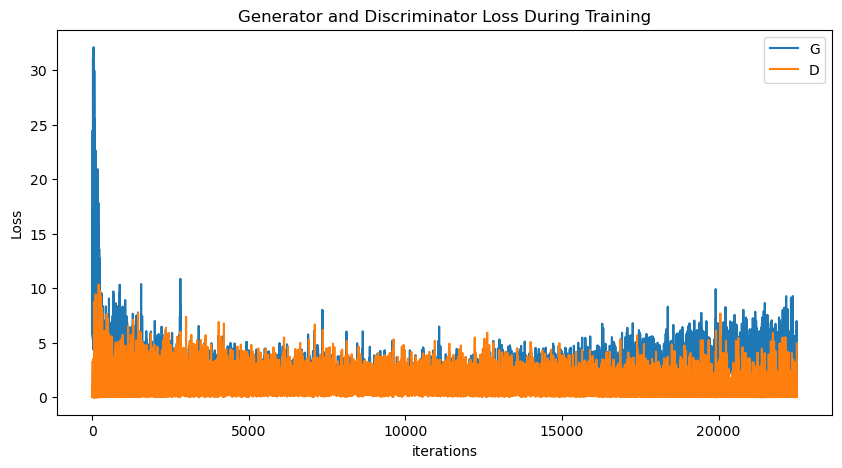

In [24]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [25]:

import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision


def show_images(netG, dataloader, device, nz=100):
    # Fetch real images
    real_images = next(iter(dataloader))[:5]
    real_images = real_images.to(device)

    # Generate fake images
    noise = torch.randn(5, nz, 1, 1, device=device)
    fake_images = netG(noise).detach().cpu()

    # Function to convert image for display
    def imshow(img):
        img = img / 2 + 0.5  # unnormalize
        npimg = img.numpy()
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
        plt.axis('off')

    # Plot real images
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.axis("off")
    plt.title("Real Images")
    imshow(torchvision.utils.make_grid(real_images, padding=2, normalize=True))

    # Plot fake images
    plt.subplot(1, 2, 2)
    plt.axis("off")
    plt.title("Fake Images")
    imshow(torchvision.utils.make_grid(fake_images, padding=2, normalize=True))

    plt.show()


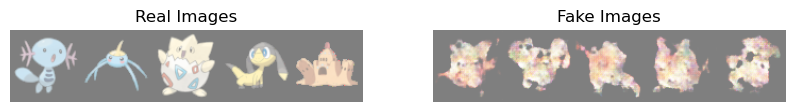

In [26]:
show_images(netG, dataloader, device)


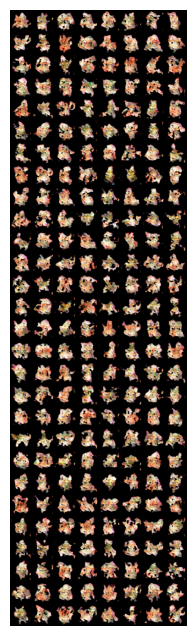

In [27]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [5]:
#   size using a transformer.
image_size = 128

batch_size = 20

num_epochs = 50
lr = 0.0001


In [6]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os
from torchvision.transforms import Lambda


class CustomDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.images[idx])
        image = Image.open(img_name)
        if self.transform:
            image = self.transform(image)
        return image

# Path to your single folder with images
dataroot = dataroot
# Define transformations
from torchvision.transforms import Lambda

# Define transformations
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.Lambda(lambda img: img.convert('RGB') if img.mode != 'RGB' else img),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


# Create the dataset
dataset = CustomDataset(image_dir=dataroot, transform=transform)

# Create the dataloader
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)


In [7]:
class CustomDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.images[idx])
        image = Image.open(img_name)
        if self.transform:
            image = self.transform(image)
        return image

# Path to your single folder with images
dataroot = dataroot
# Define transformations
from torchvision.transforms import Lambda

# Define transformations
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.Lambda(lambda img: img.convert('RGB') if img.mode != 'RGB' else img),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


# Create the dataset
dataset = CustomDataset(image_dir=dataroot, transform=transform)

# Create the dataloader
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

torch.Size([20, 3, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

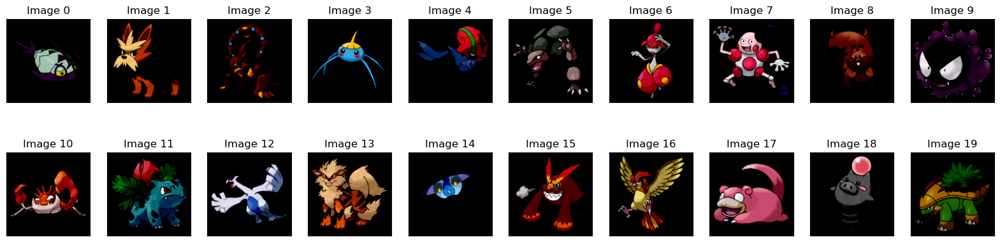

In [10]:
dataiter = iter(dataloader)
images = next(dataiter)  # Fetch a batch of images
print(images.shape)

def RGBshow(img):
    img = img.numpy()
    plt.imshow(np.transpose(img, (1, 2, 0)))
plot_only = 20
rows = 2
cols = (plot_only + 1) // 2  # This ensures enough columns for all images
fig = plt.figure(figsize=(20, 5))

for idx in range(plot_only):
    ax = fig.add_subplot(rows, cols, idx + 1, xticks=[], yticks=[])
    RGBshow(images[idx])
    ax.set_title(f"Image {idx}")
plt.show()  # Ensure this is outside the loop


In [11]:
import torch
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.init_size = 16  # Adjusted for 128x128 images
        self.l1 = nn.Sequential(nn.Linear(latent_dim, 128 * self.init_size * self.init_size))

        self.conv_blocks = nn.Sequential(
            nn.ConvTranspose2d(128, 64 * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64 * 2, momentum=0.1, eps=0.8),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64 * 2, 64 * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64 * 4, momentum=0.1, eps=0.8),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64 * 4, 64 * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64 * 8, momentum=0.1, eps=0.8),
            nn.ReLU(inplace=True),

            nn.Conv2d(64 * 8, 3, kernel_size=5, padding=2, bias=False),
            nn.Tanh()
        )
    def forward(self, input):
        out = self.l1(input.view(input.size(0), -1))
        # Reshape to [batch_size, 128, init_size, init_size]
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        return self.conv_blocks(out)



In [15]:
latent_dim = 100
# Number of GPUs to use (0 for CPU mode)

# Create the generator
netG = Generator(latent_dim)

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(custom_weights_init)

# Print the model
print(netG)


Generator(
  (l1): Sequential(
    (0): Linear(in_features=100, out_features=32768, bias=True)
  )
  (conv_blocks): Sequential(
    (0): ConvTranspose2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(512, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
    (10): Tanh()
  )
)


In [16]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            # Input shape: (3) x 128 x 128
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (64) x 64 x 64
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (128) x 32 x 32
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (256) x 16 x 16
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (512) x 8 x 8
            nn.Flatten(),
            nn.Linear(512 * 8 * 8, 1),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [17]:

netD = Discriminator()

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(custom_weights_init)

# Print the model
print(netD)



Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Flatten(start_dim=1, end_dim=-1)
    (12): Linear(in_features=32768, out_features=1, bias=True)
    (13): Sigmoid()
  

In [18]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(128, nz, 1, 1)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [19]:
# Training Loop
import torchvision.utils as vutils


device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

       
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        real_cpu = real_cpu.unsqueeze(0)  # Add .unsqueeze(0) here
        real_cpu.shape
        b_size = real_cpu.size(0)  # Match batch size with the second code
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/50][0/45]	Loss_D: 1.4633	Loss_G: 3.9739	D(x): 0.4170	D(G(z)): 0.4450 / 0.0188
[1/50][0/45]	Loss_D: 0.1713	Loss_G: 4.1050	D(x): 0.8653	D(G(z)): 0.0263 / 0.0165
[2/50][0/45]	Loss_D: 0.0180	Loss_G: 4.7909	D(x): 0.9933	D(G(z)): 0.0112 / 0.0083
[3/50][0/45]	Loss_D: 0.0241	Loss_G: 4.6030	D(x): 0.9998	D(G(z)): 0.0236 / 0.0100
[4/50][0/45]	Loss_D: 0.0373	Loss_G: 4.9202	D(x): 0.9676	D(G(z)): 0.0043 / 0.0073
[5/50][0/45]	Loss_D: 0.4096	Loss_G: 5.3886	D(x): 0.9993	D(G(z)): 0.3356 / 0.0046
[6/50][0/45]	Loss_D: 0.1444	Loss_G: 3.9599	D(x): 0.9829	D(G(z)): 0.1194 / 0.0191
[7/50][0/45]	Loss_D: 0.0383	Loss_G: 4.0058	D(x): 0.9734	D(G(z)): 0.0112 / 0.0182
[8/50][0/45]	Loss_D: 0.2936	Loss_G: 2.7187	D(x): 0.7784	D(G(z)): 0.0422 / 0.0660
[9/50][0/45]	Loss_D: 0.1759	Loss_G: 3.3129	D(x): 0.9537	D(G(z)): 0.1206 / 0.0364
[10/50][0/45]	Loss_D: 0.1655	Loss_G: 4.3209	D(x): 0.9918	D(G(z)): 0.1455 / 0.0133
[11/50][0/45]	Loss_D: 1.4262	Loss_G: 5.5380	D(x): 0.7465	D(G(z)): 0.6782 / 0.0039


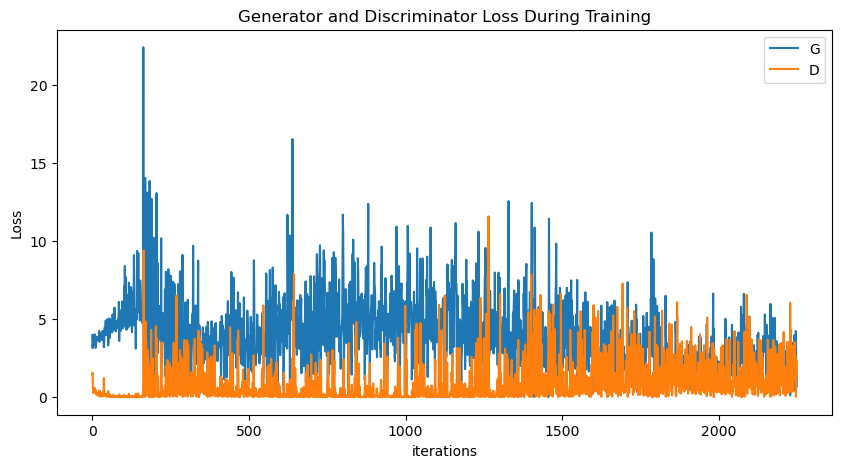

In [20]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

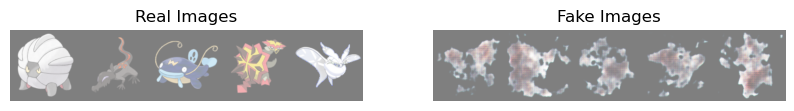

Shape of Real Images: torch.Size([5, 3, 128, 128])
Shape of Fake Images: torch.Size([5, 3, 128, 128])


In [25]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision

def show_images(netG, dataloader, device, nz=100):
    # Fetch real images
    real_images = next(iter(dataloader))[:5]
    real_images = real_images.to(device)

    # Generate fake images
    noise = torch.randn(5, nz, 1, 1, device=device)
    fake_images = netG(noise).detach().cpu()

    # Function to convert image for display
    def imshow(img):
        img = img / 2 + 0.5  # unnormalize
        npimg = img.numpy()
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
        plt.axis('off')

    # Plot real images
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.axis("off")
    plt.title("Real Images")
    imshow(torchvision.utils.make_grid(real_images, padding=2, normalize=True))

    # Plot fake images
    plt.subplot(1, 2, 2)
    plt.axis("off")
    plt.title("Fake Images")
    imshow(torchvision.utils.make_grid(fake_images, padding=2, normalize=True))

    plt.show()

    # Return shapes of real and fake images
    return real_images.shape, fake_images.shape

# Assuming you have netG, dataloader, and device defined elsewhere
real_shape, fake_shape = show_images(netG, dataloader, device)
print("Shape of Real Images:", real_shape)
print("Shape of Fake Images:", fake_shape)
